In [1]:
# 1. Add paths and import env variables
import sys
from os import environ
database_uri = environ['DATABASE_URI']
sys.path.insert(0, '/app')
sys.path.insert(0, '/data')

In [2]:
# 2. Imports and topic setup
import string
import spacy
import numpy as np
import matplotlib.pyplot as plt

from time import time

from sqlalchemy import create_engine, ForeignKey, Column, Integer, String, Text, select
from sqlalchemy.orm import declarative_base, relationship, Session

from articles_orm import Base, Article, ArticleFeatures
from utils import read_file_content, money_merger, print_topics, plot_top_words, get_recommendation

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import TruncatedSVD, NMF, LatentDirichletAllocation
from sklearn.metrics.pairwise import cosine_similarity, linear_kernel


topic_list = read_file_content('/data/topics.txt')
en_stopwords = read_file_content('/data/stopwords_en.txt')

print(topic_list)

['crypto', 'bitcoin', 'covid', 'vaccine', 'startups', 'technology', 'e-commerce', 'Nokia', 'Apple', 'Microsoft']


In [3]:
# 3. Setup engine to database.
engine = create_engine(database_uri)

In [4]:
# 4. Query all articles
with Session(engine) as session:
    articles = session.query(Article).all()
print(len(articles))
print(articles[-1].id)

678
678


In [5]:
# 5. For every article from db, preprocess text
# (preprocessing: punctuation and stopwords removal, numericals extraction, lemmatization, NER)
nlp = spacy.load('en_core_web_md')
#nlp.remove_pipe("lemmatizer")
#nlp.add_pipe("lemmatizer", config={"mode": "lookup"}).initialize()
nlp.add_pipe("merge_entities")
nlp.add_pipe('money_merger', after='ner')

additional_remove_chars = "'\"`—“’”\n"
punctuation = string.punctuation.replace('-','')+additional_remove_chars

articles_lt = []
articles_features = []
for article in articles:
    # preprocess
    article_features = {}
    article_doc = nlp(article.maintext)
    article_doc = money_merger(article_doc)
    lemmas = [token.lemma_ for token in article_doc 
              if 
              token.lemma_ not in en_stopwords 
              and token.lemma_ not in punctuation]
    # pull out number of numericals as a feature of its own
    article_numericals = [lemma for lemma in lemmas if any(char.isdigit() for char in lemma)]
    # clean original lemmas from numericals
    lemmas = [lemma for lemma in lemmas if not any(char.isdigit() for char in lemma)]
    # pull out named entities as a feature of its own
    named_entities = {ent.label_: set([ent.text for inent in article_doc.ents if 
                                   inent.label_ == ent.label_]) for ent in article_doc.ents}
    article_lemmatized = ' '.join(lemmas)
    article_features['article_id'] = article.id
    article_features['named_entities'] = named_entities
    article_features['num_numericals'] = len(article_numericals)
    article_features['lemmatized_text'] = article_lemmatized
    articles_features += [article_features]
    articles_lt += [article_lemmatized]
print(articles_features)
print(articles_lt)

[{'article_id': 1, 'named_entities': {'PERSON': {'Warren'}, 'CARDINAL': {'100'}, 'DATE': {'Tuesday'}, 'ORG': {'the Financial Stability Oversight Council'}, 'GPE': {'Yellen'}, 'TIME': {'Tuesday night'}, 'MONEY': {'more than $80 billion'}}, 'num_numericals': 4, 'lemmatized_text': "Mike Novogratz high - profile bitcoin crypto investor John Lamparski Getty Images billionaire investor Mike Novogratz attack Elizabeth Warren call tough crypto regulation DeFi transparent bank deliver benefit consumer Novogratz Warren n't progressive I sign daily newsletter thing Opening Bell billionaire investor Mike Novogratz criticize Senator Elizabeth Warren 's anti - crypto stance decentralize finance DeFi progressive force transparent consumer bank Warren Tuesday send letter Treasury Secretary Janet Yellen call tough rule cryptocurrencie industry senator concern retail investor hurt volatile unregulated market Novogratz tweet Warren Tuesday night n't progressive I famed crypto investor bank charge overdra

In [6]:
# 6. TfIdf with bigrams
vectorizer = TfidfVectorizer(ngram_range=(1,2), 
                             sublinear_tf=True, 
                             use_idf=True, 
                             stop_words=en_stopwords, 
                             min_df=0.001, 
                             max_df=0.85)
tf = vectorizer.fit_transform(articles_lt)
feature_names = vectorizer.get_feature_names()
# Print the shape of tf
print(tf.shape)
print(feature_names)
print(tf)

(678, 172372)
['aaa', 'aaa title', 'aam', 'aam advanced', 'aan', 'aan den', 'aap', 'aap small', 'aapl', 'aapl accord', 'aapl april', 'aapl drop', 'aapl earning', 'aapl kind', 'aapl officially', 'aapl report', 'aapl revenue', 'aapl share', 'aapl tuesday', 'aaron', 'aaron add', 'aaron katersky', 'aaron lammer', 'aaron price', 'aaron rakers', 'aaron sheldrick', 'aaron wilder', 'aave', 'aave aave', 'aave crypto', 'aave form', 'aave founder', 'aax', 'aax monetary', 'ab', 'ab inbev', 'ab novaturas', 'abandon', 'abandon app', 'abandon chrome', 'abandon commercial', 'abandon neck', 'abandon oil', 'abandon restriction', 'abandon search', 'abandon team', 'abandonment', 'abandonment cloud', 'abandonment commerce', 'abandonment cost', 'abandonment costly', 'abandonment ignore', 'abandonment issue', 'abandonment large', 'abandonment user', 'abandonment window', 'abbott', 'abbott laboratories', 'abbott sign', 'abbreviation', 'abbreviation exhibit', 'abbreviation technavio', 'abbv', 'abbv compelling'

In [7]:
# 7.1. Principal Component Analysis 
# performed through Singular Value Decomposition applied on a TfIdf model renders Latent Semantic Indexing
svd5 = TruncatedSVD(n_components=5, random_state=289925)
svd10 = TruncatedSVD(n_components=10, random_state=289925)
svd50 = TruncatedSVD(n_components=50, random_state=289925)

t0 = time()
pca5 = svd5.fit(tf.toarray())
print(f"PCA5 fitted in {time() - t0}s")
t0 = time()
pca10 = svd10.fit(tf.toarray())
print(f"PCA10 fitted in {time() - t0}s")
t0 = time()
pca50 = svd50.fit(tf.toarray())
print(f"PCA50 fitted in {time() - t0}s")

t0 = time()
tf_svd5 = svd5.transform(tf)
print(f"PCA5 transformed in {time() - t0}s")
t0 = time()
tf_svd10 = svd10.transform(tf)
print(f"PCA10 transformed in {time() - t0}s")
t0 = time()
tf_svd50 = svd50.transform(tf)
print(f"PCA50 transformed in {time() - t0}s")

print(pca5.components_.shape)
print(tf_svd5.shape)
print(pca10.components_.shape)
print(tf_svd10.shape)
print(pca50.components_.shape)
print(tf_svd50.shape)

PCA5 fitted in 4.202290058135986s
PCA10 fitted in 6.362407445907593s
PCA50 fitted in 10.705607414245605s
PCA5 transformed in 0.008899927139282227s
PCA10 transformed in 0.00718235969543457s
PCA50 transformed in 0.0409083366394043s
(5, 172372)
(678, 5)
(10, 172372)
(678, 10)
(50, 172372)
(678, 50)


In [8]:
# 7.2. Nonnegative Matrix Factorization with Kullback-Leibler divergence
nmf5 = NMF(n_components=5, init='nndsvda', beta_loss='kullback-leibler', solver='mu', random_state=289925)
nmf10 = NMF(n_components=10, init='nndsvda', beta_loss='kullback-leibler', solver='mu', random_state=289925)
nmf50 = NMF(n_components=50, init='nndsvda', beta_loss='kullback-leibler', solver='mu', random_state=289925)

t0 = time()
nmf5.fit(tf)
print(f"NMF5 fitted in {time() - t0}s")
t0 = time()
nmf10.fit(tf)
print(f"NMF10 fitted in {time() - t0}s")
t0 = time()
nmf50.fit(tf)
print(f"NMF50 fitted in {time() - t0}s")

t0 = time()
tf_nmf5 = nmf5.transform(tf)
print(f"NMF5 transformed in {time() - t0}s")
t0 = time()
tf_nmf10 = nmf10.transform(tf)
print(f"NMF10 transformed in {time() - t0}s")
t0 = time()
tf_nmf50 = nmf50.transform(tf)
print(f"NMF50 transformed in {time() - t0}s")

print(nmf5.components_.shape)
print(tf_nmf5.shape)
print(nmf10.components_.shape)
print(tf_nmf10.shape)
print(nmf50.components_.shape)
print(tf_nmf50.shape)

NMF5 fitted in 2.6785521507263184s
NMF10 fitted in 2.828535556793213s
NMF50 fitted in 11.201805114746094s
NMF5 transformed in 0.48624300956726074s
NMF10 transformed in 0.6320147514343262s
NMF50 transformed in 1.7342302799224854s
(5, 172372)
(678, 5)
(10, 172372)
(678, 10)
(50, 172372)
(678, 50)


In [9]:
# 7.3. Latent Dirichlet Allocation
cnt_vectorizer = CountVectorizer(ngram_range=(1,2), stop_words=en_stopwords, min_df=2, max_df=0.85)
cnt_tf = cnt_vectorizer.fit_transform(articles_lt)
lda5 = LatentDirichletAllocation(n_components=5, learning_method='online', random_state=289925)
lda10 = LatentDirichletAllocation(n_components=10, learning_method='online', random_state=289925)
lda50 = LatentDirichletAllocation(n_components=50, learning_method='online', random_state=289925)

t0 = time()
lda5.fit(cnt_tf)
print(f"LDA5 fitted in {time()-t0}s")
t0 = time()
lda10.fit(cnt_tf)
print(f"LDA10 fitted in {time()-t0}s")
t0 = time()
lda50.fit(cnt_tf)
print(f"LDA50 fitted in {time()-t0}s")

t0 = time()
tf_lda5 = lda5.transform(cnt_tf)
print(f"LDA5 transformed in {time()-t0}s")
t0 = time()
tf_lda10 = lda10.transform(cnt_tf)
print(f"LDA10 transformed in {time()-t0}s")
t0 = time()
tf_lda50 = lda50.transform(cnt_tf)
print(f"LDA50 transformed in {time()-t0}s")

print(lda5.components_.shape)
print(tf_lda5.shape)
print(lda10.components_.shape)
print(tf_lda10.shape)
print(lda50.components_.shape)
print(tf_lda50.shape)

LDA5 fitted in 2.461028814315796s
LDA10 fitted in 3.2781710624694824s
LDA50 fitted in 9.61497449874878s
LDA5 transformed in 0.11503100395202637s
LDA10 transformed in 0.1455976963043213s
LDA50 transformed in 0.3141312599182129s
(5, 28200)
(678, 5)
(10, 28200)
(678, 10)
(50, 28200)
(678, 50)


In [10]:
# 8.1. Display 15 top words in each topic in each method
print("==PCA==")
print("==5==")
print_topics(pca5, feature_names)
print("==10==")
print_topics(pca10, feature_names)
print("==50==")
print_topics(pca50, feature_names)

print()
print("==NMF==")
print("==5==")
print_topics(nmf5, feature_names)
print("==10==")
print_topics(nmf10, feature_names)
print("==50==")
print_topics(nmf50, feature_names)

print()
print("==LDA==")
print("==5==")
print_topics(lda5, feature_names)
print("==10==")
print_topics(lda10, feature_names)
print("==50==")
print_topics(lda50, feature_names)

==PCA==
==5==
0 company, year, market, business, share, growth, time, report, high, revenue, investor, quarter, well, people, include, 
1 cookie, block load, happen browser, cookie policy, cookie block, service cookie, review term, javascript cookie, load review, support javascript, javascript, browser support, term service, browser, load, 
2 gupshup, sheth, buy deal, private market, tiger, tiger global, ipo, startup, venture, buy, venture capital, messaging, private, chat, deal, 
3 twitter discord, year tease, feature twitter, thread early, discord introduce, tease feature, tease, discord, thread, early year, twitter, introduce, feature, early, year, 
4 vaccine, discord introduce, year tease, twitter discord, tease feature, feature twitter, thread early, vaccinate, discord, thread, tease, wednesday, dose, coronavirus, government, 
==10==
0 company, year, market, business, share, growth, time, report, high, revenue, investor, quarter, well, people, include, 
1 cookie, cookie policy, ja

36 circuitpython, adafruit, playground, circuit playground, circuit, xbox, console, arduino, wallet app, alligator clip, python hardware, clip pad, alligator, makecode, card wallet, 
37 circuitpython, adafruit, playground, circuit playground, spotify, circuit, bitcoin, pfizer, arduino, podcast, moderna, alligator clip, clip pad, alligator, makecode, 
38 africa, xbox, shipment, south africa, console, nigeria, african, sell, late shipment, nigeria south, official late, microsoft, dose, white house, urgently, 
39 xbox, console, microsoft, xbox series, sony, game, series, gb, fast sell, playstation, binance, sell copy, fast, ryan, game pass, 
40 zimbabwe, mcaz, minister, xbox, medicines, dose china, zimbabwe receive, console, johnson, african, hassan, aifa, jab, safety vaccine, trefis, 
41 share, sell, shopify, shanghai, regulatory move, fund, chinese government, trade chinese, investor, ark, jab, chinese, early, stock, day early, 
42 yandex, season, capital, mankind, ripple, series, seaso

41 stock, market, share, chinese, sell, zomato, government, investor, china, shanghai, yuan, week, regulatory move, founder, day, 
42 siri, company, sirikit, release, forward statement, sea, intent, tencent, sea limited, app, statement, stock, share, developer, third party, 
43 binance, tax reporting, zhao, tax, regulator, crypto, season, user, firm, third, fourth, reporting tool, cryptocurrency, update, transaction, 
44 capital, startup, raise, yandex, firm, venture, year, company, fund, founder, russian internet, invest, demyashkevich, funding, venture capital, 
45 amazon, insider, bitcoin, google, payment, bitcoin payment, advertising, ad, facebook, video, youtube, tech, digital, shop, giant, 
46 samsung, security, office, hassan, employee, threat, remote, leader, technology, company, tanzania, cyber, work, safety, device, 
47 garcetti, analyst, quarter, acquisition, martinez, cloud, microsoft, state, los angeles, los, angeles, mayor, city employee, employee, city, 
48 market, comme

30 appreciate interest, additionally feature, approach customer, adhanom, america large, applicable security, claudia becerra, agustin, authenticity media, attacker ip, auction original, america lead, approach create, bias accept, beverage happy, 
31 appreciation case, business expertise, arab emirates, allergan abbvie, clear technology, allergic, card execute, americans frustrate, bitcoin role, ban dust, apply rigorous, americans director, border card, coin offer, black entrepreneur, 
32 addition equally, boston alliance, automate high, basis order, america webpage, commerce connection, card execute, action action, announcement virtual, arab emirates, bitcoin fake, athlete open, additional governance, cagr gain, approve eu, 
33 addepar win, commit productive, combine share, america webpage, combine strong, approve eu, candidate slip, candidate learn, american adult, afternoon join, ability produce, admire giza, amount fund, ashton talk, afternoon linkedin, 
34 affect microsoft, accoun

0

For n_clusters = 5 The average silhouette_score is : 0.5492191172397959


/opt/conda/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:792: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  warnings.warn("'n_jobs' was deprecated in version 0.23 and will be"


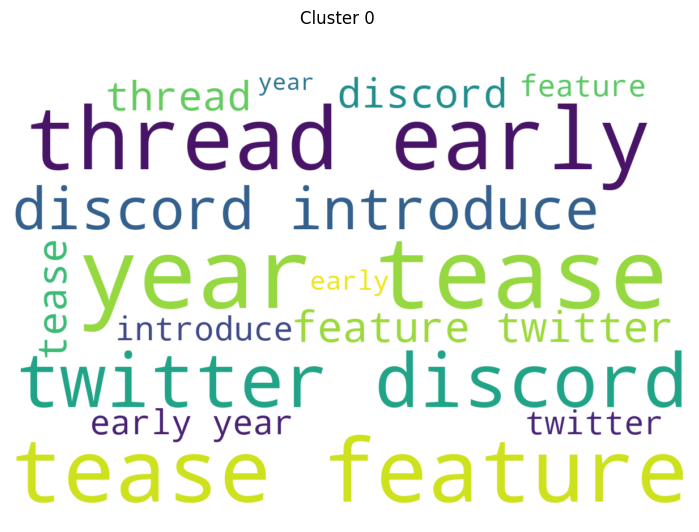

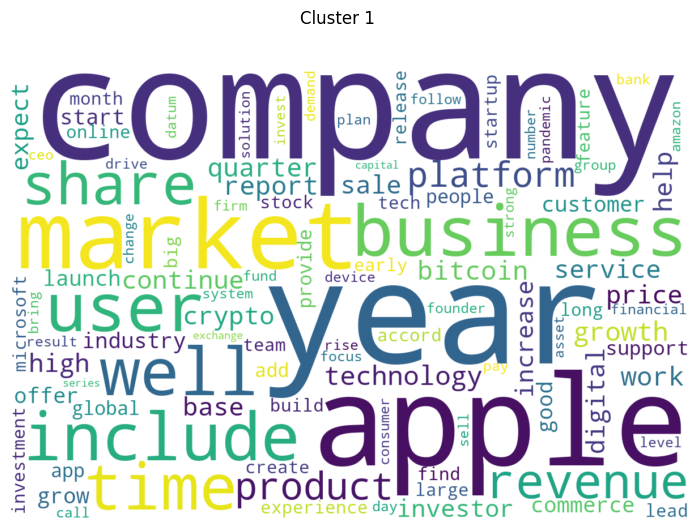

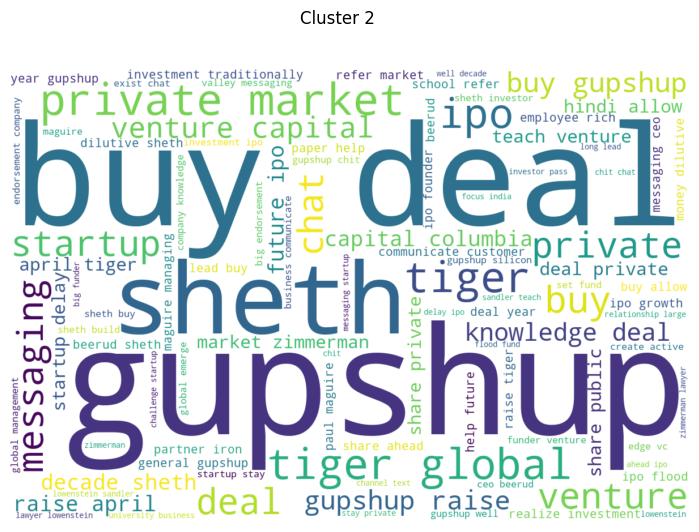

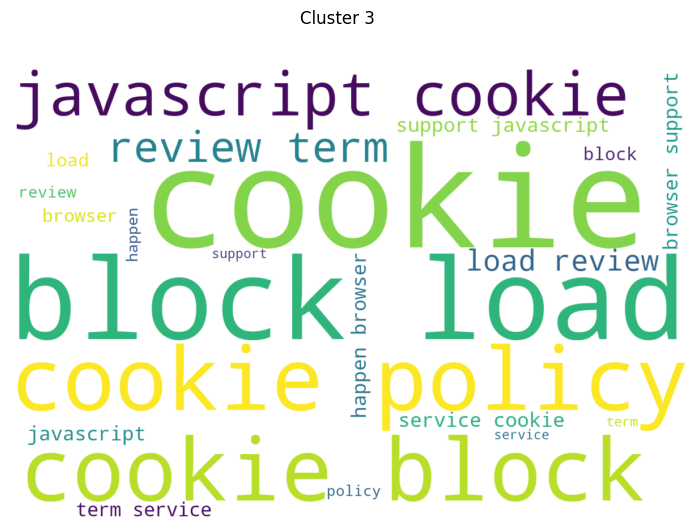

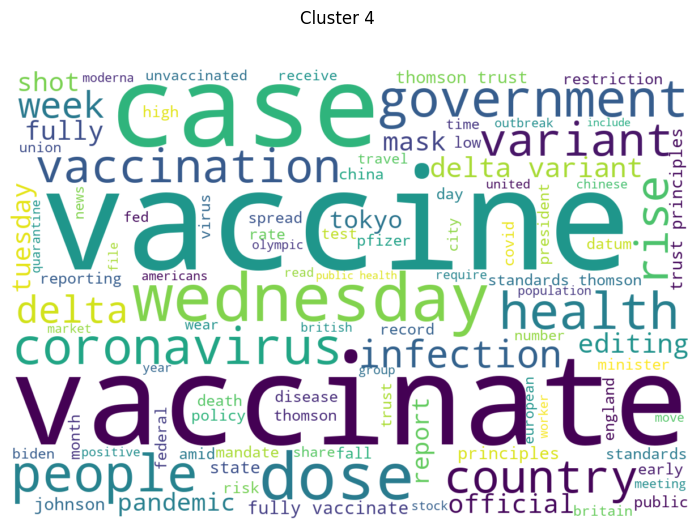

In [11]:
# 8.2. Show the topics as wordclouds -- TODO display the already made topics instead of additional clustering
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

def generate_wordclouds(X, in_X_tfidf, k, in_word_positions, file_prefix):

    # Clustering
    in_model = KMeans(n_clusters=k, random_state=289925, n_jobs=-1)
    in_y_pred = in_model.fit_predict(X)
    in_cluster_ids = set(in_y_pred)
    silhouette_avg = silhouette_score(X, in_y_pred)
    print("For n_clusters =", k, "The average silhouette_score is :", silhouette_avg)

    # Number of words with highest tfidf score to display
    top_count = 100

    for in_cluster_id in in_cluster_ids:
        # compute the total tfidf for each term in the cluster
        in_tfidf = in_X_tfidf[in_y_pred == in_cluster_id]
        # numpy.matrix
        tfidf_sum = np.sum(in_tfidf, axis=0)
        # numpy.array of shape (1, X.shape[1])
        tfidf_sum = np.asarray(tfidf_sum).reshape(-1)
        top_indices = tfidf_sum.argsort()[-top_count:]
        term_weights = {in_word_positions[in_idx]: tfidf_sum[in_idx] for in_idx in top_indices}
        wc = WordCloud(width=1200, height=800, background_color="white")
        wordcloud = wc.generate_from_frequencies(term_weights)
        fig, ax = plt.subplots(figsize=(10, 6), dpi=100)
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.axis("off")
        fig.suptitle(f"Cluster {in_cluster_id}")
        plt.savefig(f"{file_prefix}_cluster_{in_cluster_id}.png")
        plt.show()

    return in_cluster_ids


word_positions = {v: k for k, v in vectorizer.vocabulary_.items()}
_ = generate_wordclouds(tf_svd5, tf, 5, word_positions, "pca5")

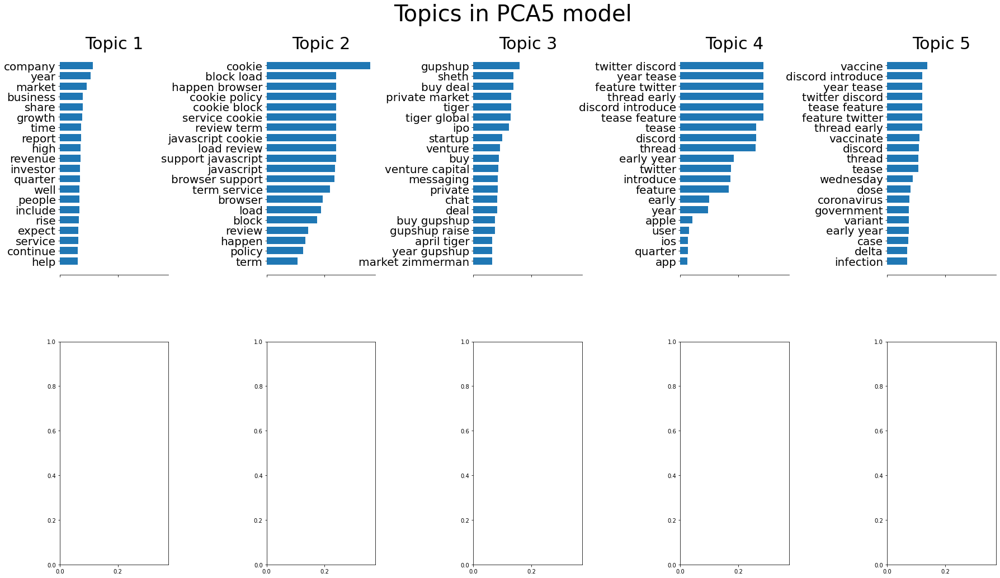

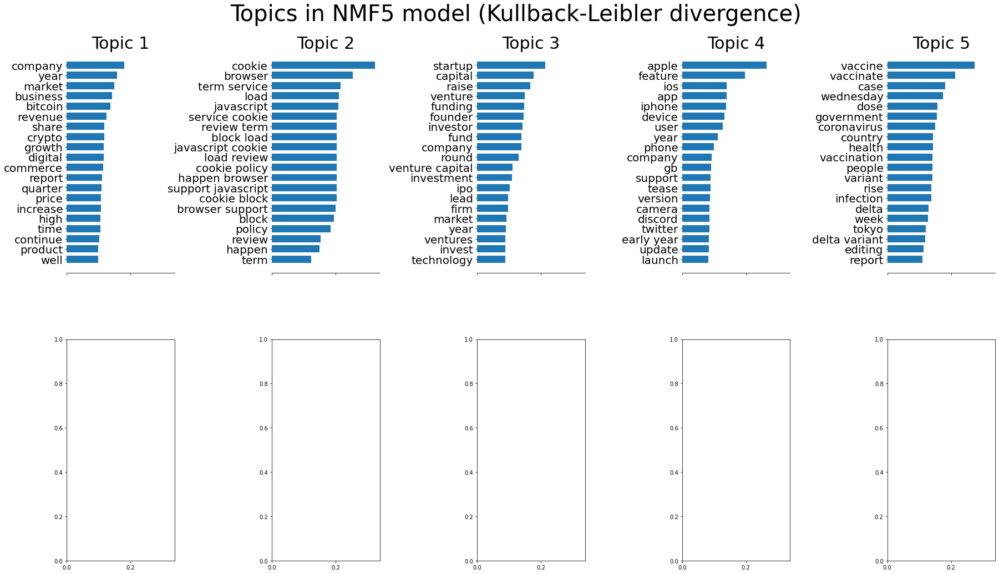

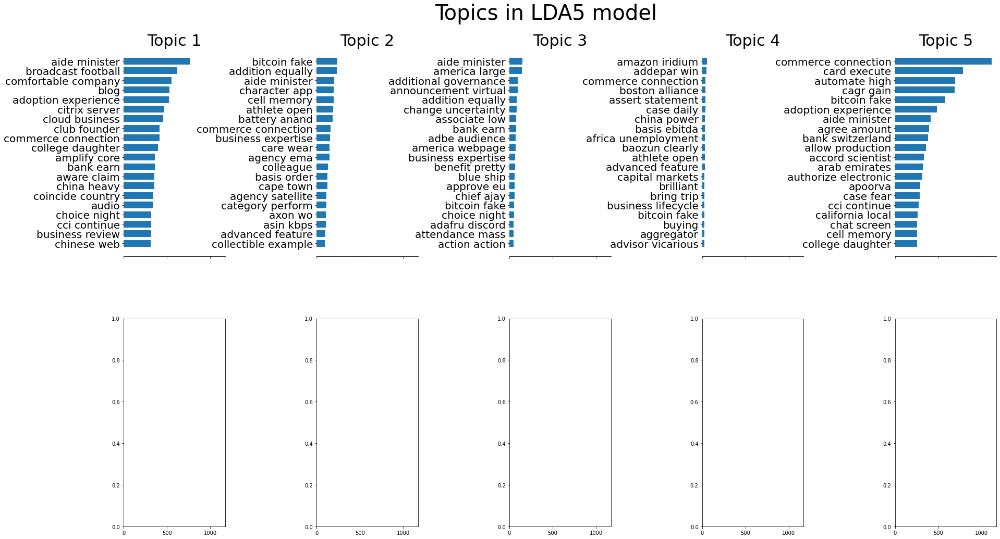

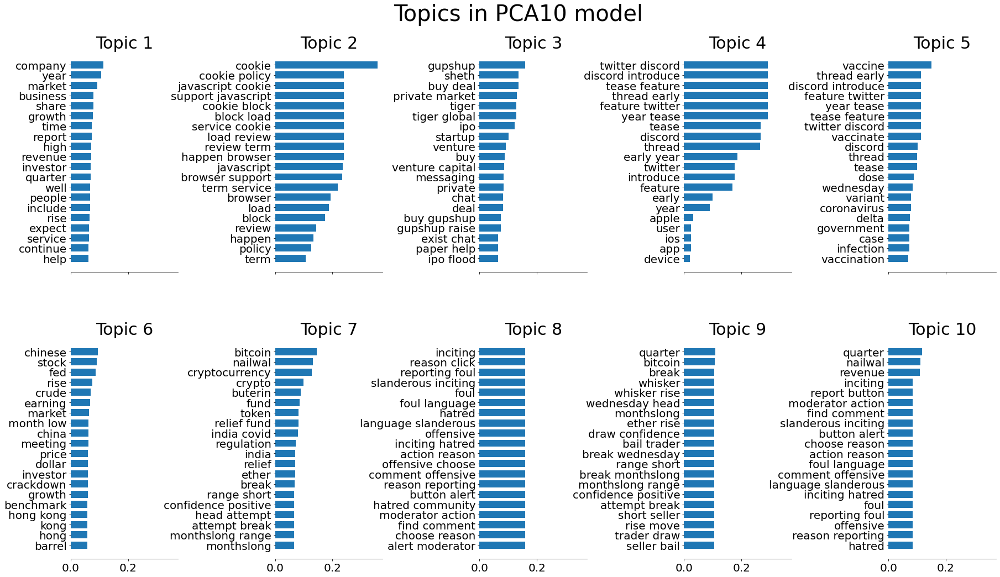

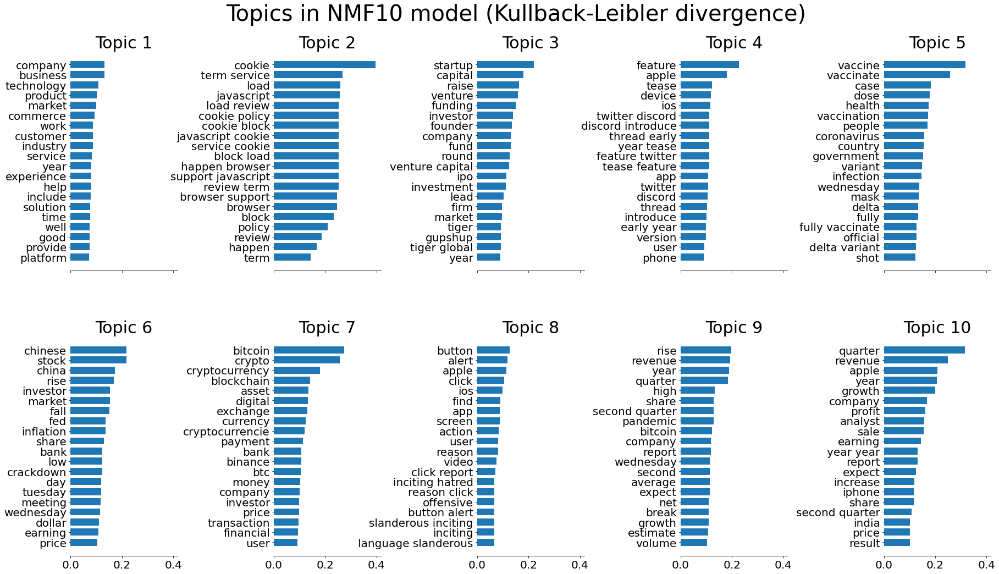

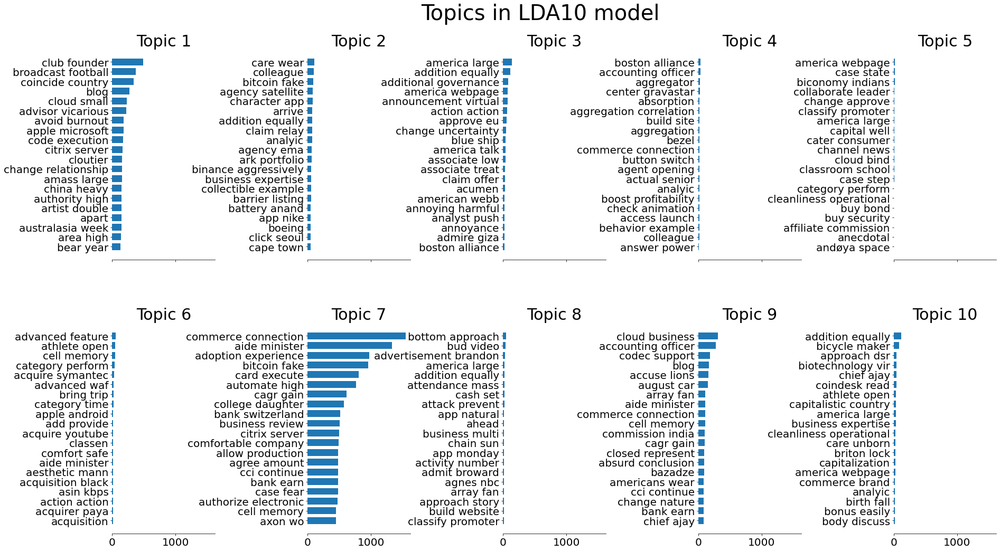

IndexError: index 10 is out of bounds for axis 0 with size 10

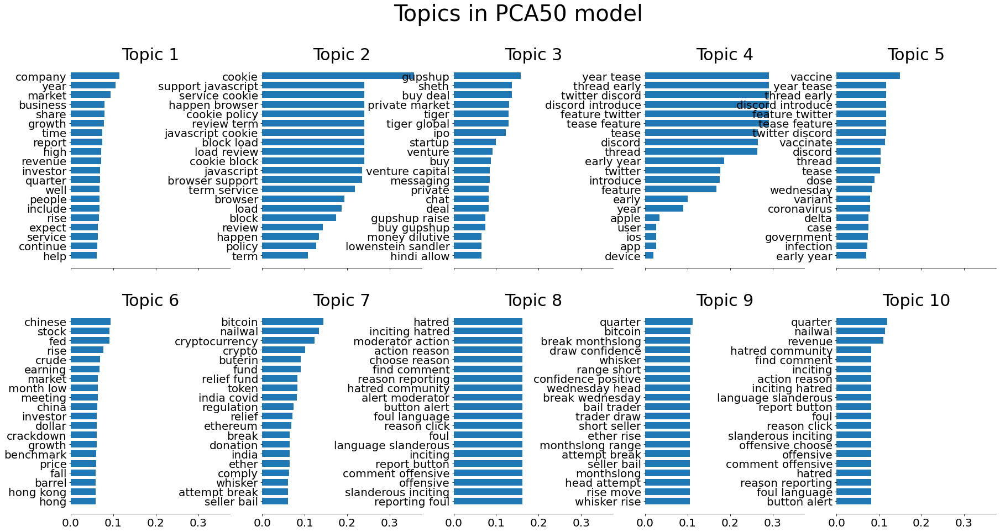

In [12]:
# 8.3. Show topics as vertical plots regarding frequency of tokens 
plot_top_words(pca5, feature_names, 20,
                'Topics in PCA5 model')
plot_top_words(nmf5, feature_names, 20,
               'Topics in NMF5 model (Kullback-Leibler divergence)')
plot_top_words(lda5, feature_names, 20,
               'Topics in LDA5 model')
print()
plot_top_words(pca10, feature_names, 20,
                'Topics in PCA10 model')
plot_top_words(nmf10, feature_names, 20,
               'Topics in NMF10 model (Kullback-Leibler divergence)')
plot_top_words(lda10, feature_names, 20,
               'Topics in LDA10 model')
print()
plot_top_words(pca50, feature_names, 20,
                'Topics in PCA50 model')
plot_top_words(nmf50, feature_names, 20,
               'Topics in NMF50 model (Kullback-Leibler divergence)')
plot_top_words(lda50, feature_names, 20,
               'Topics in LDA50 model')

In [ ]:
# Look at vectors - for debugging purposes
print(f"PCA5 vectors:\n {tf_svd5}")
print(f"NMF5 vectors:\n {tf_nmf5}")
print(f"LDA5 vectors:\n {tf_lda5}")
print('\n')
print(f"PCA5 vectors similarity:\n {linear_kernel(tf_svd5)}")
print(f"NMF5 vectors similarity:\n {linear_kernel(tf_nmf5)}")
print(f"LDA5 vectors similarity:\n {linear_kernel(tf_lda5)}")

In [13]:
#9. Recommend an article

## Clear Tfidf
get_recommendation(0, articles, tf, linear_kernel, text_repr="Clear TfIdf")

print()
## PCA
get_recommendation(0, articles, tf_svd5, linear_kernel, text_repr="PCA5")
get_recommendation(0, articles, tf_svd10, linear_kernel, text_repr="PCA10")
get_recommendation(0, articles, tf_svd50, linear_kernel, text_repr="PCA50")

print()
## NMF
get_recommendation(0, articles, tf_nmf5, linear_kernel, text_repr="NMF5")
get_recommendation(0, articles, tf_nmf10, linear_kernel, text_repr="NMF10")
get_recommendation(0, articles, tf_nmf50, linear_kernel, text_repr="NMF50")

print()
## LDA
get_recommendation(0, articles, tf_lda5, linear_kernel, text_repr="LDA5")
get_recommendation(0, articles, tf_lda10, linear_kernel, text_repr="LDA10")
get_recommendation(0, articles, tf_lda50, linear_kernel, text_repr="LDA50")

==Clear TfIdf==
Source article:
Article(topic=crypto, title=Billionaire investor Mike Novogratz attacks Elizabeth Warren's anti-crypto stance, saying DeFi is far more transparent than banks, description=Mike Novogratz is one of the most high-profile bitcoin and crypto investors. John Lamparski/Getty Images Billionaire investor Mike Novogratz a... url=https://markets.businessinsider.com/news/currencies/mike-novogratz-elizabeth-warren-crypto-cryptocurrencies-decentralized-finance-defi-2021-7)
Recommended articles:
0 US stocks edge higher as investors digest earnings results from mega-cap tech 16.6%
1 Digital currency may be an answer to help the unbanked, Sen. Warren says 9.2%
2 Regulators scrutinizing Tether’s commercial paper reserves: Comptroller of the Currency 8.4%
3 Gooooood morning Forty! Party time as Bitcoin breaches $40,000 6.2%
4 Ether trading volumes surged by over 1,000% in the first half of this year, easily beating bitcoin's growth for the first time 5.8%

==PCA5==
Source 